In [1]:
image_path = '../data/raw/220413/tiff/reflection'
verfiy_image = image_path + '/dark_blue/220413A_X0p7_RWhite.tiff'

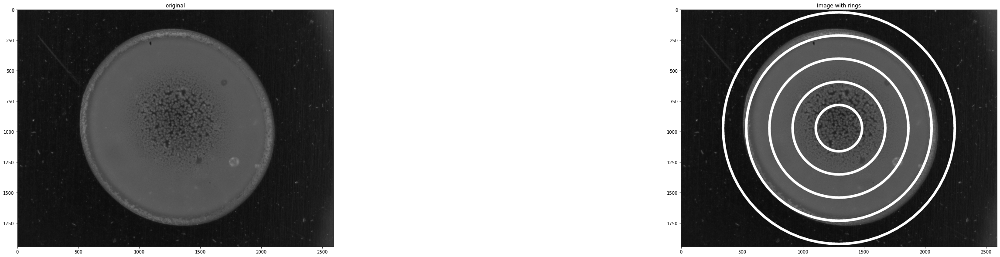

In [2]:
from pathlib import Path
import numpy as np
from PIL import Image, ImageDraw
from matplotlib import pyplot as plt
import cv2

img_origin = Image.open(verfiy_image)
# display(img_origin)
fig = plt.figure(figsize=(50, 10))
ax = fig.add_subplot(1, 2, 1)
ax.set_title('original')
ax.imshow(img_origin, cmap='gray', vmin=0, vmax=255)

x, y, r = round(img_origin.size[0] / 2), round(img_origin.size[1] / 2), 190
img_origin = np.array(img_origin)
color = (255, 0, 0)
for i in range(5):
    cv2.circle(img_origin, (x,y), r * (i+1), color, 2*10)
# plt.title(title)
ax = fig.add_subplot(1, 2, 2)
ax.set_title('Image with rings')
ax.imshow(img_origin, cmap='gray', vmin=0, vmax=255)
plt.show()

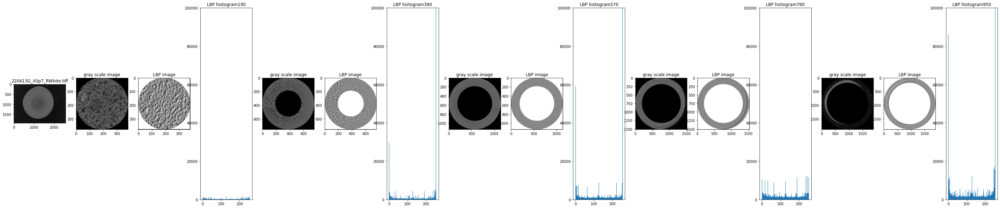

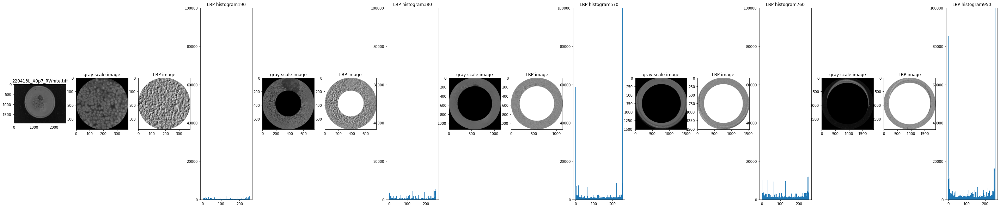

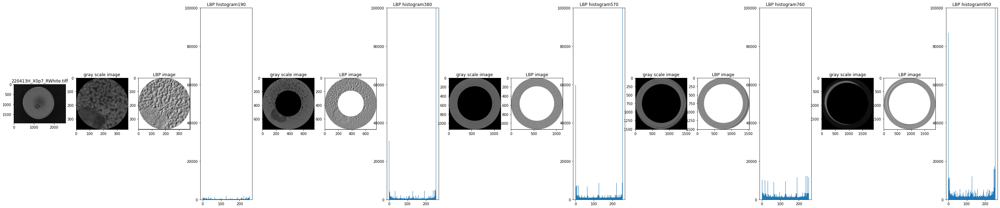

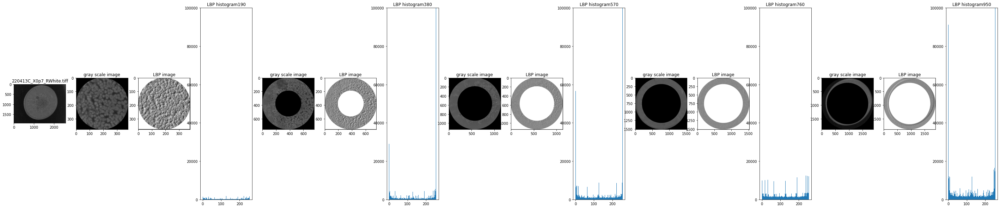

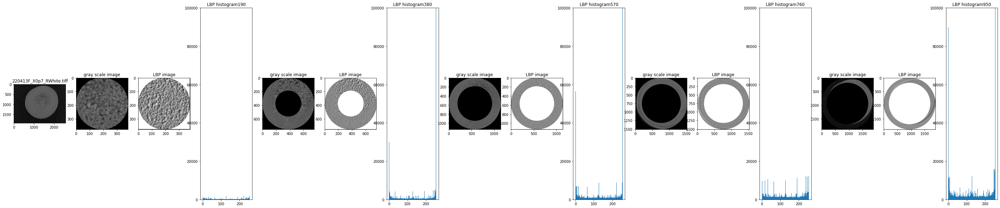

...

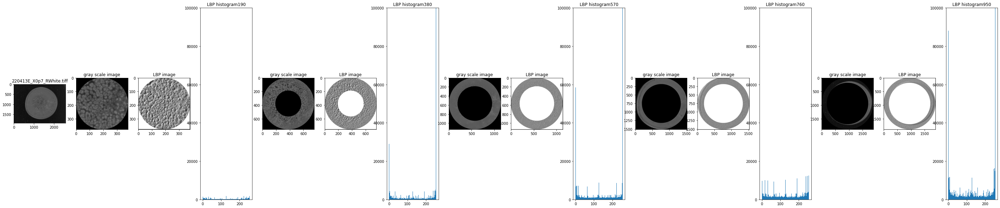

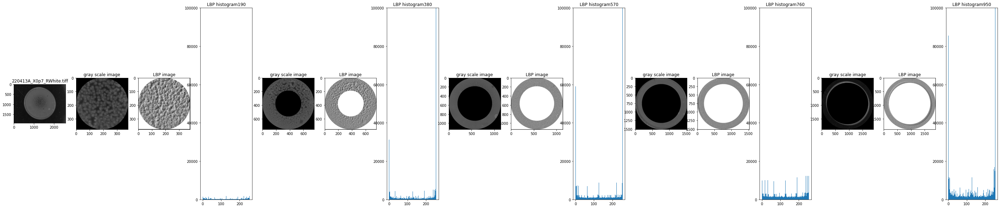

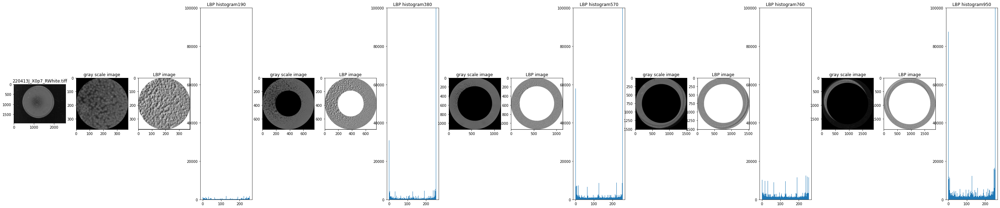

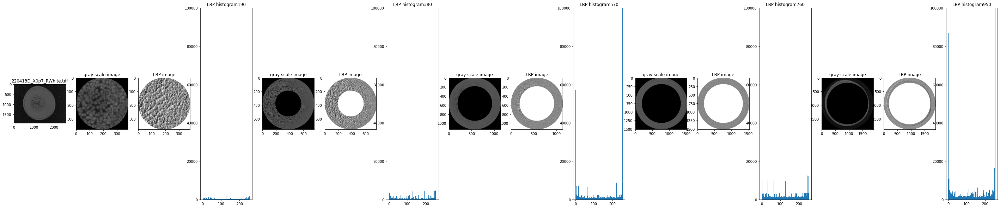

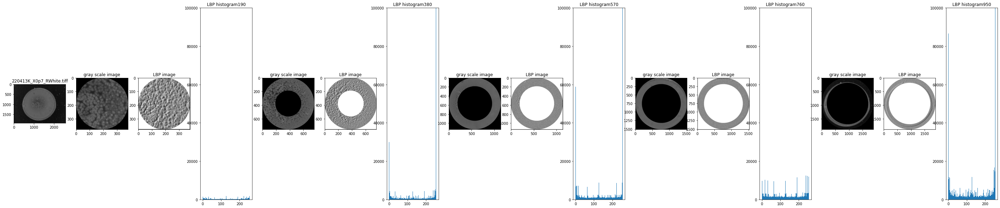

In [3]:
import os
from src.features.build_features import getLBPimage, create_lbp_by_rings
import cv2
from src.models.train_model import multiple_cls_test, preprocess_data

__file__ = os.path.abspath('')

project_dir = Path(__file__).resolve()


dark_blue = Path(str(image_path) + '/dark_blue').resolve()

db_data, db_labels = create_lbp_by_rings(dark_blue)

In [4]:
db_data[0][0].shape

(380, 380)

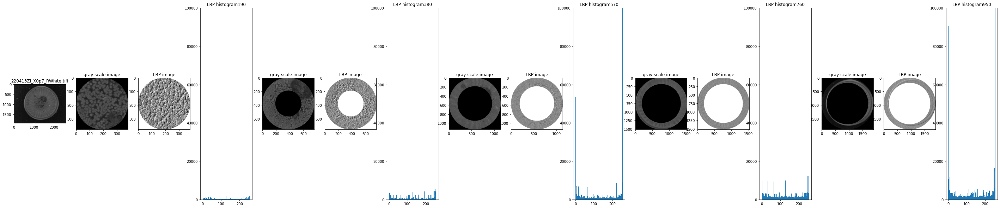

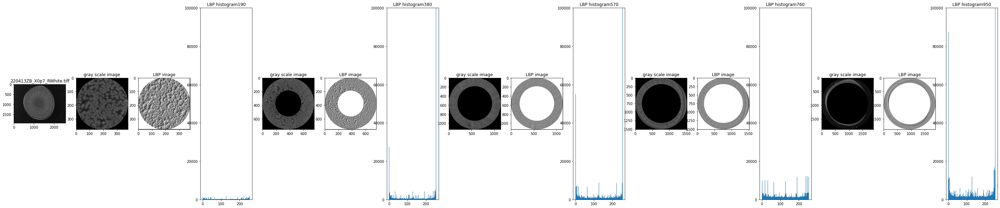

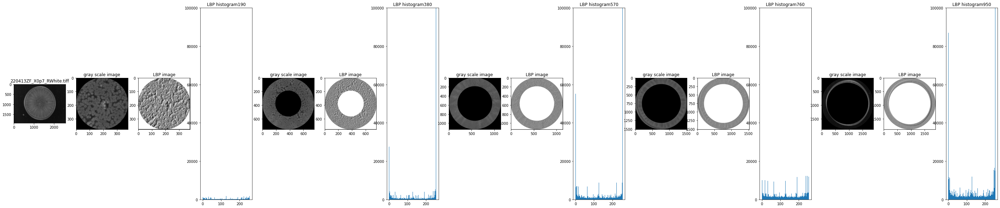

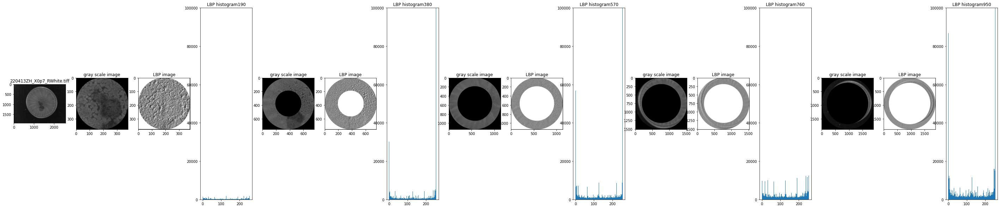

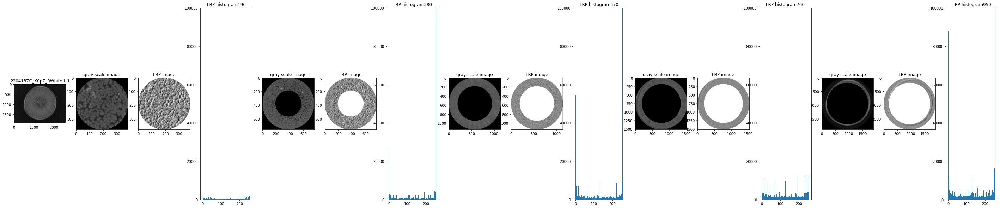

...

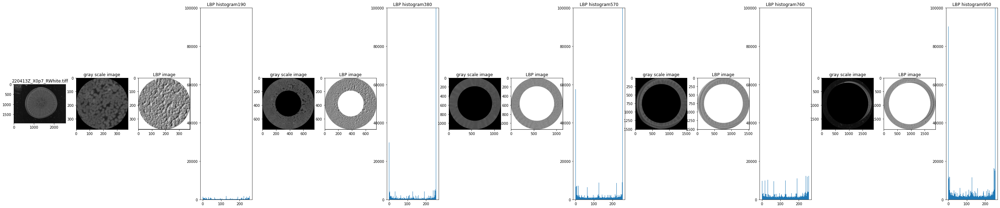

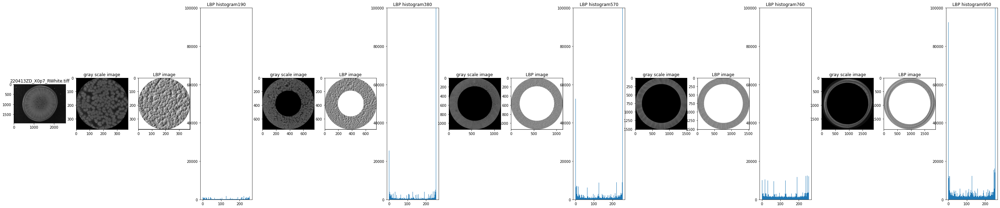

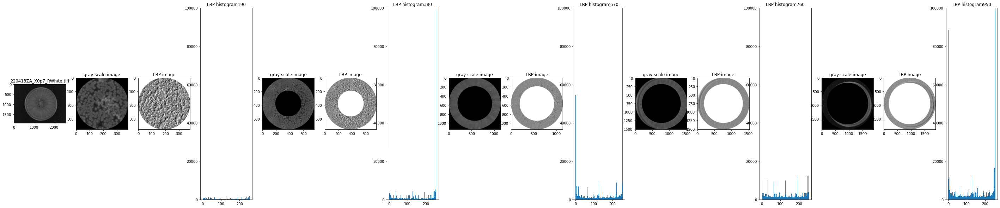

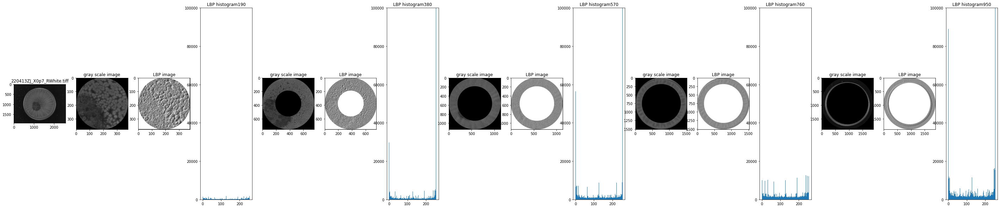

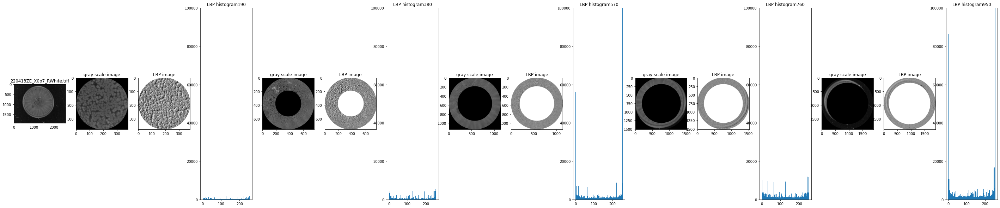

In [5]:
dbm_path = Path(str(image_path) + '/dbm_gm').resolve()

dbm_data, dbm_labels = create_lbp_by_rings(dbm_path)

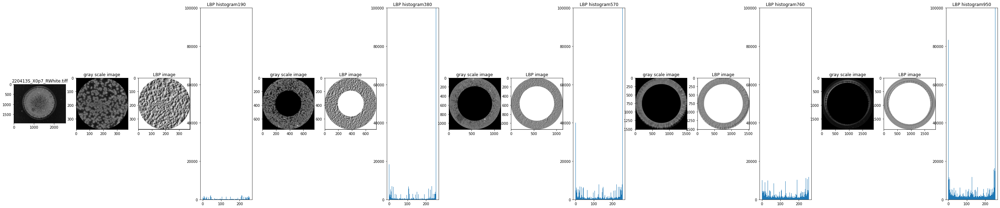

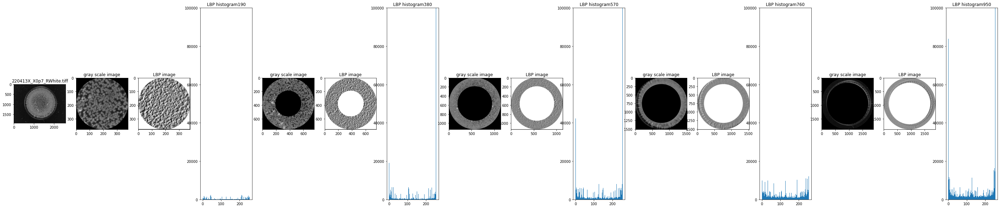

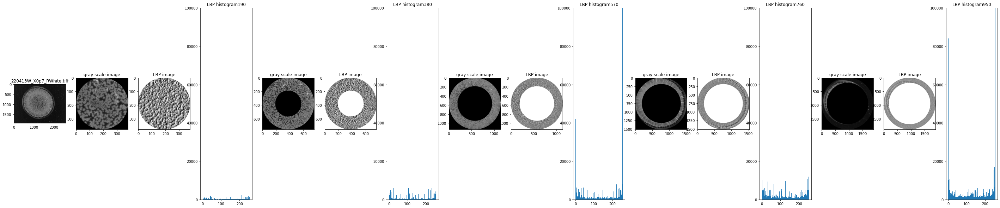

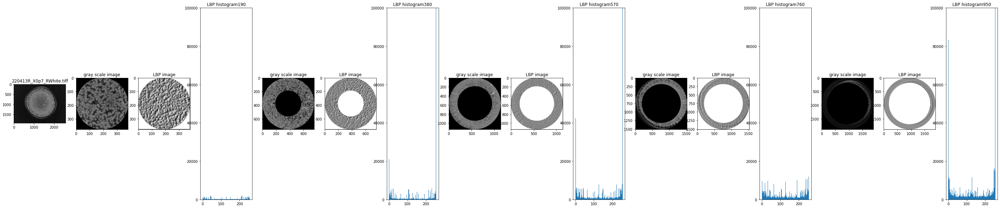

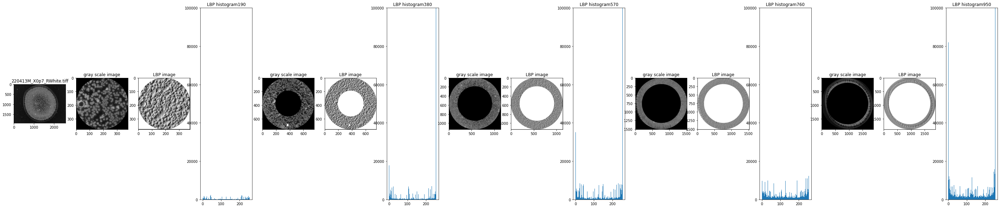

...

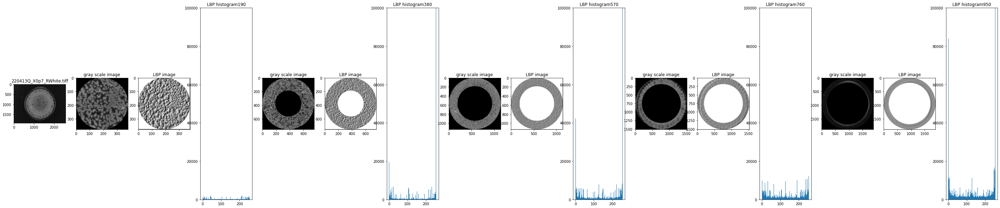

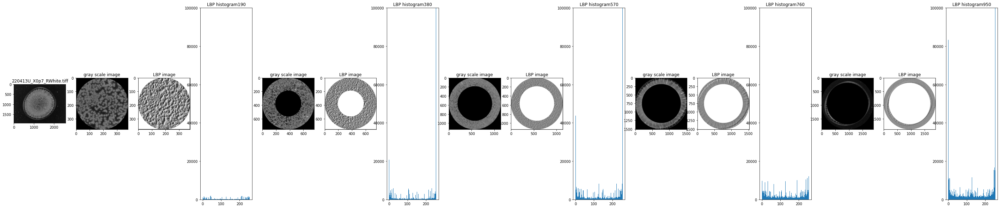

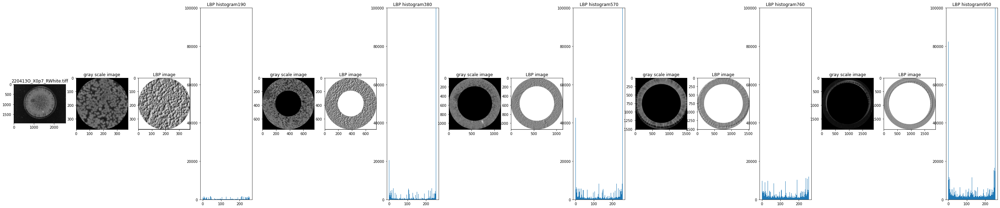

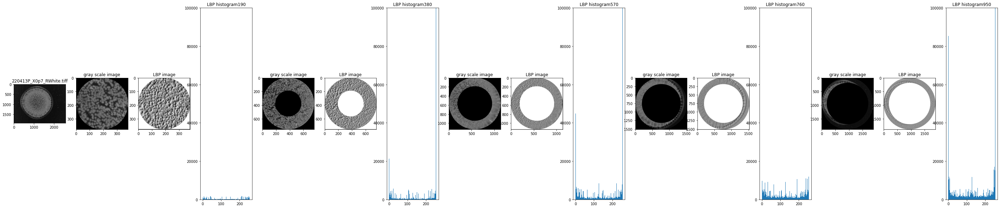

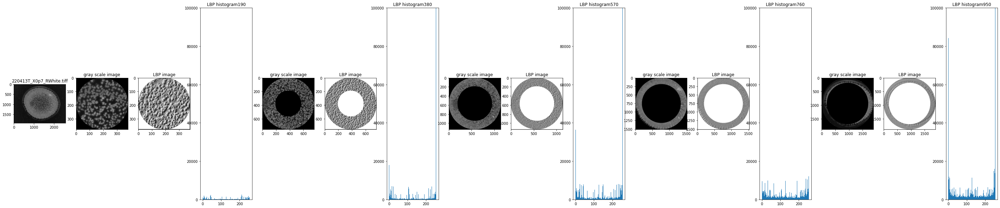

In [6]:
green_trim = Path(str(image_path) + '/green_trim').resolve()
gt_data, gt_labels =create_lbp_by_rings(green_trim)

In [7]:
all_vector_data = []
for i in range(5):
    all_vector_data.append(db_data[i] + dbm_data[i] + gt_data[i])
all_labels = db_labels + dbm_labels + gt_labels

In [8]:
def train_test_cls(trainX, testX, trainY, testY, classifier, le):
    model = classifier #KNeighborsClassifier(n_neighbors=3, n_jobs=-1)
    model.fit(trainX, trainY)
    return round(model.score(testX, testY),2)

In [9]:
from src.models.train_model import preprocess_data
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import  train_test_split
from sklearn.metrics import classification_report
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier

def measure_performance(data, labels):
    trainX, testX, trainY, testY, le = preprocess_data(data, labels)
    print(len(trainX[0]), len(testX))
#     print(trainY, testY)
    cls = KNeighborsClassifier(n_neighbors=3, n_jobs=-1)
    
    results = train_test_cls(trainX, testX, trainY, testY, cls, le)
#     print('The results of KNeighborsClassifier:')
#     print(results)
    result_ac.append(results)

    cls = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0,
     max_depth=1, random_state=0)
    results = train_test_cls(trainX, testX, trainY, testY, cls, le)
#     print('The results of GradientBoostingClassifier:')
#     print(results)
    result_ac.append(results)

    cls = DecisionTreeClassifier(random_state=0)
    results = train_test_cls(trainX, testX, trainY, testY, cls, le)
#     print('The results of DecisionTreeClassifier:')
#     print(results)
    result_ac.append(results)
    return result_ac

result_acs = []
for i in range(5):
#     print('The ', i, ' th circle:')
    result_ac = []
    data, labels = all_vector_data[i],  all_labels
    result_acs.append(measure_performance(data, labels))

144400 9
577600 9
1299600 9
2310400 9
3610000 9


In [10]:
print(all_vector_data[0][0].shape, all_vector_data[1][0].shape,all_vector_data[4][0].shape)
np.concatenate((all_vector_data[0][0], all_vector_data[1][0],all_vector_data[4][0]), -1)
# labels = all_labels
# merged_data = []
# for i in range(len(all_vector_data[0])):
#     merged_data.append(all_vector_data[0][i]+all_vector_data[1][i]+all_vector_data[4][i])
# len(merged_data[0][0])
# result_acs.append(measure_performance(data, labels))

(380, 380) (760, 760) (1900, 1900)


ValueError: all the input array dimensions for the concatenation axis must match exactly, but along dimension 0, the array at index 0 has size 380 and the array at index 1 has size 760

In [11]:
print(len(all_vector_data[4][0]), len(all_vector_data[0][0]), len(all_vector_data[1][0]))

1900 380 760


In [12]:
result_acs

[[0.44, 0.33, 0.33],
 [0.44, 0.22, 0.22],
 [0.44, 0.0, 0.22],
 [0.44, 0.22, 0.44],
 [0.11, 0.11, 0.22]]

In [13]:
import pandas as pd
df = pd.DataFrame(result_acs, columns=['KNN', 'GradientBoost', 'Decision Tree'])
df

,KNN,GradientBoost,Decision Tree
0,0.44,0.33,0.33
1,0.44,0.22,0.22
2,0.44,0.00,0.22
3,0.44,0.22,0.44
4,0.11,0.11,0.22
